In [1]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import numpy as np
import sys
sys.path.append("../../")
from custom_functions.yolo_data import draw_polygons

In [2]:
weight = "runs/segment/Word_Det_2/weights/best.pt" ## (SEGMENTATION)
# weight = "runs/detect/train4/weights/best.pt" ## (BBOX)

# weight = "runs/segment/Table_Det/weights/best.pt"
model = YOLO(model=weight)
# res = model.predict(source="../../Data/test/Letters", imgsz=320)

In [4]:
res = model.predict(source="../../Data/test/Tables/20230327_234825.jpeg", imgsz=640, conf=0.4, iou=0.8)


image 1/1 D:\Dropbox\College\ImageToDoc\Data\Test\Tables\20230327_234825.jpeg: 480x640 149 Tables, 115.1ms
Speed: 1.6ms preprocess, 115.1ms inference, 53.6ms postprocess per image at shape (1, 3, 640, 640)


from pathlib import Path
import numpy as np
p = Path("../../Data/test/Tables")
image_paths = list(p.glob("*"))
img = plt.imread(image_paths[0])
r = model(image_paths[0])

for i in range(len(r[0].masks.data)):
    plt.imshow(r[0].masks.data[i].cpu().numpy().astype(np.uint8))
    plt.show()

In [107]:
# res[0].masks.data[1].to(device="cpu").numpy().astype(np.uint8)
poly = res[0][0].masks.xyn[0]
inds = poly.argsort(axis=0)
poly = poly.tolist()
# tl = poly[*inds[0]]
# br = poly[*inds[-1]]
# tr = poly[inds[-1][1]]
# bl = poly[inds[-1][0]]
# tl, br, tr, bl

polygon = [poly[inds[0][0]], poly[inds[0][1]], poly[inds[-1][1]], poly[inds[-1][0]]]

polygon

[[0.26249998807907104, 0.04791666567325592],
 [0.30781248211860657, 0.0],
 [0.2671874761581421, 0.05416666716337204],
 [0.3421874940395355, 0.01249999925494194]]

In [7]:
def draw_boxes(img, boxes, color=(200,20,10), thickness=4):
    for box in boxes:
        cv2.rectangle(img, (box[0], box[1]), (box[2], box[3]), color=color, thickness=thickness)
    
    return img

# BBOX

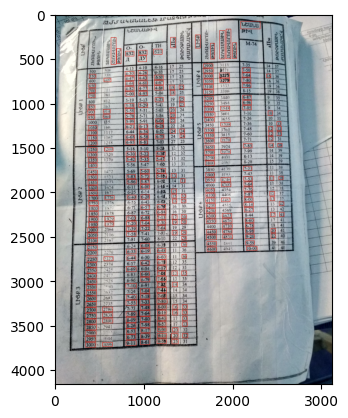

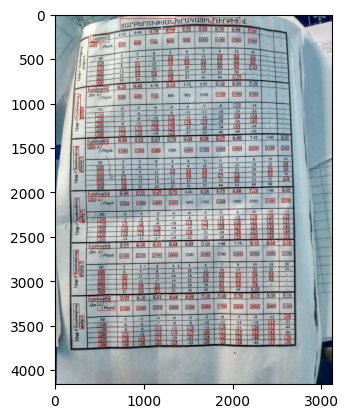

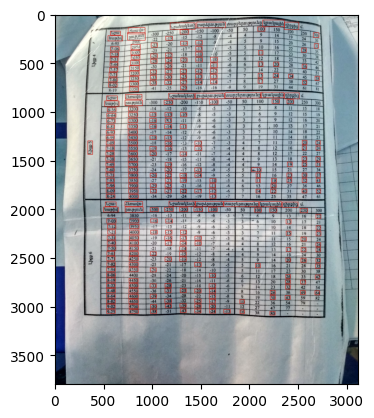

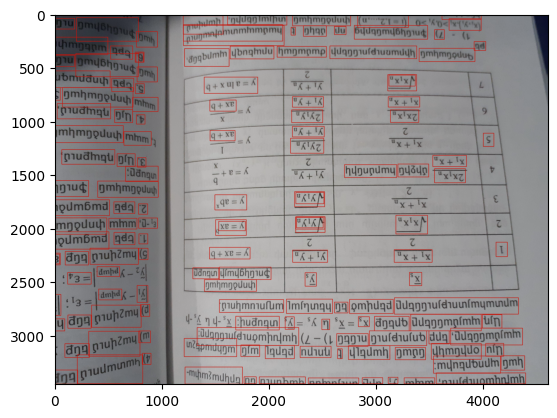

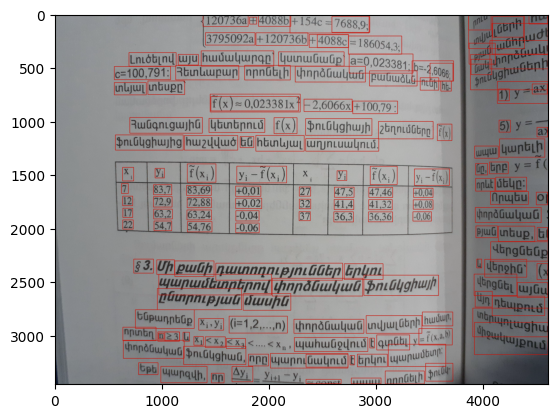

...

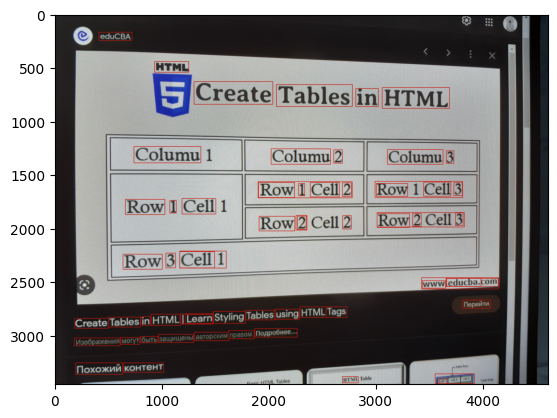

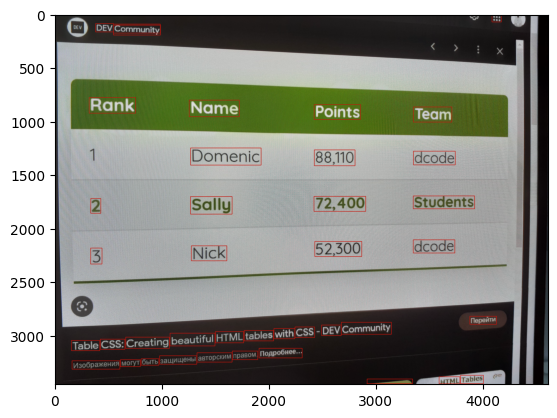

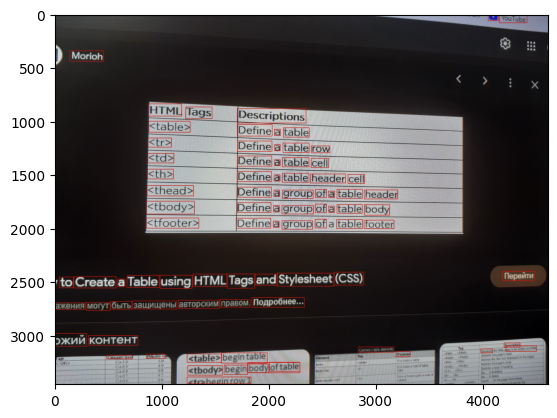

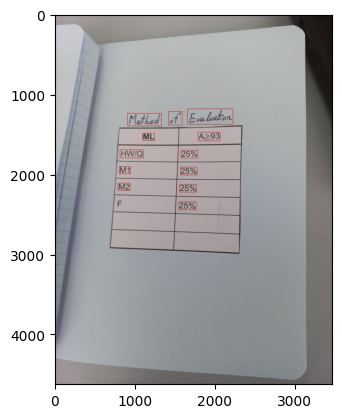

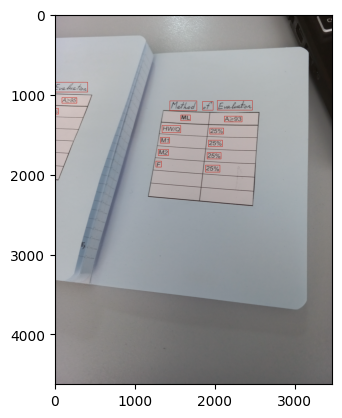

KeyboardInterrupt: 

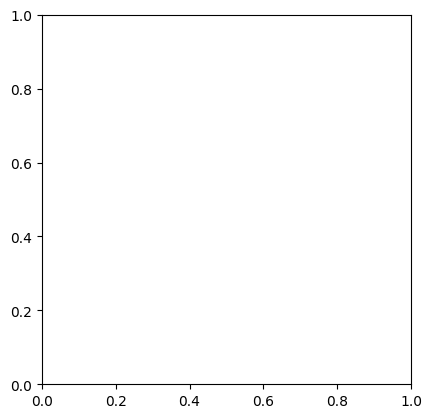

In [8]:
for i,word in enumerate(res[:]):
    boxes = word.boxes.data[:, :4].cpu().numpy().astype(int)
    plt.imshow(draw_boxes(word.orig_img, boxes))
    plt.show()

# Segmentation

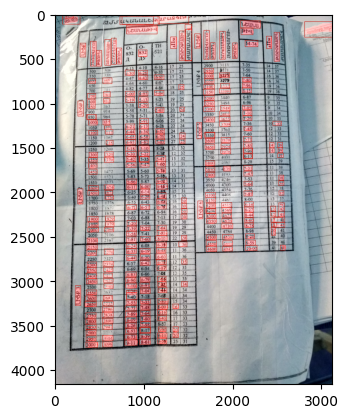

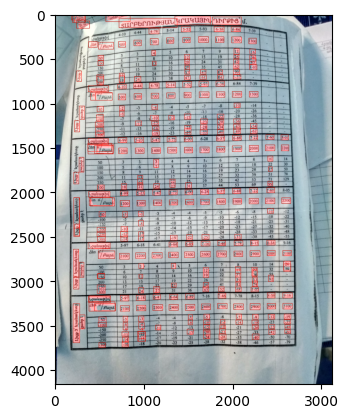

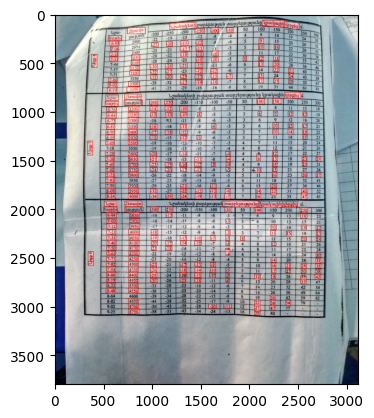

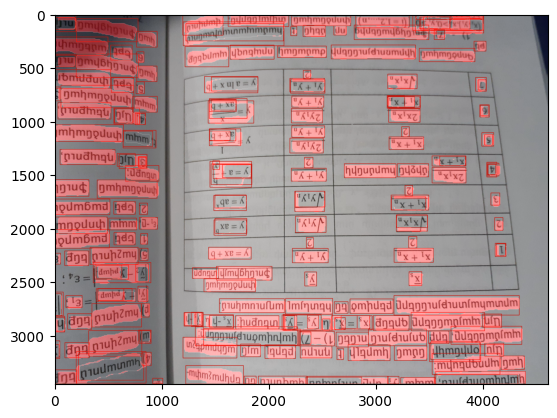

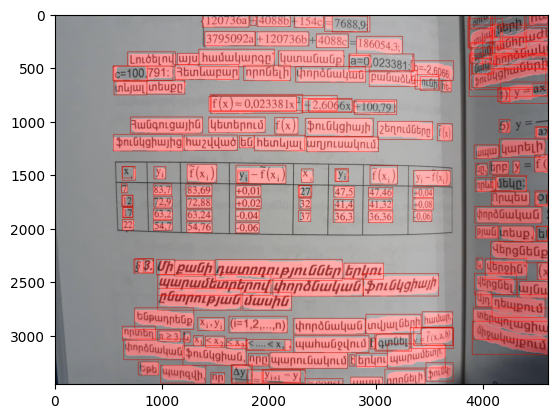

...

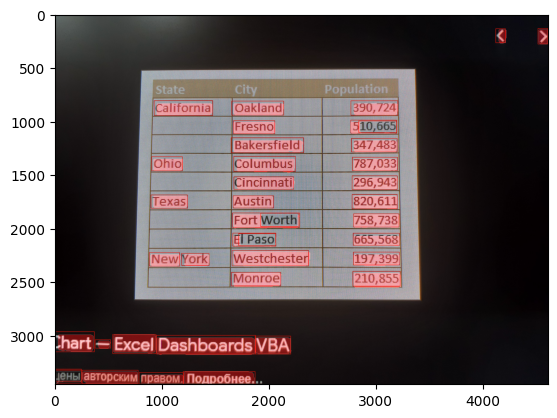

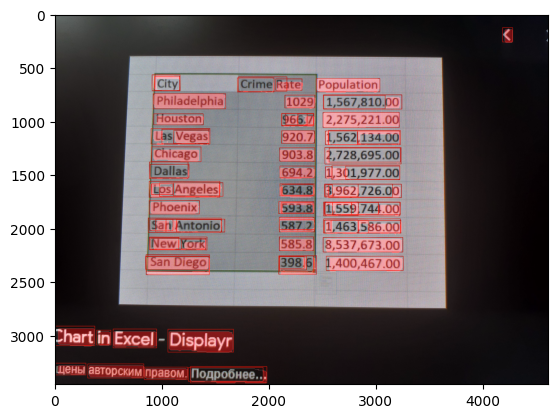

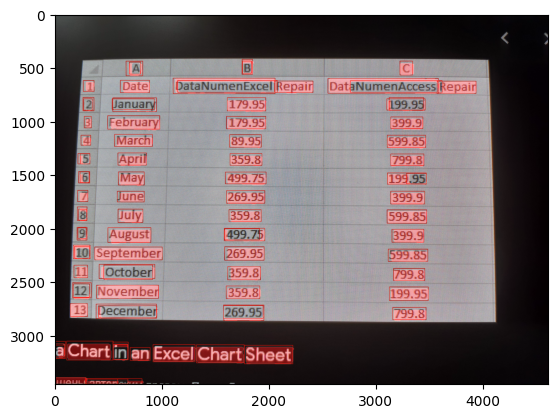

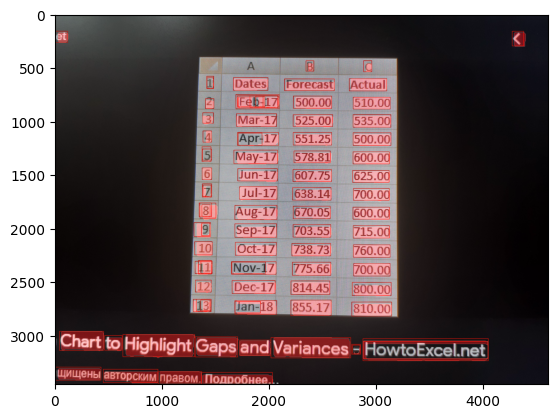

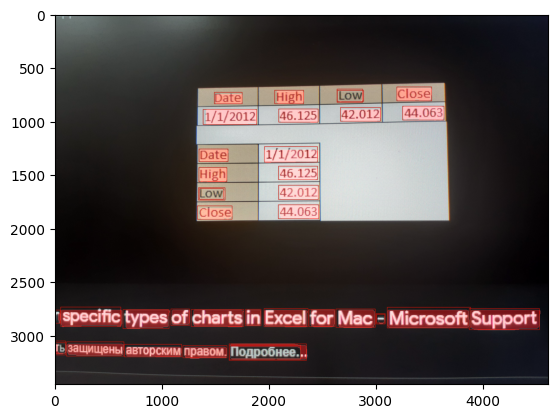

error: Unknown C++ exception from OpenCV code

In [6]:
for i,word in enumerate(res[:]):
    boxes = word.boxes.data[:, :4].cpu().numpy().astype(int)
    polygons = [ (seg*np.array(word.orig_shape[::-1])).astype(int) for seg in word.masks.xyn]
    plt.imshow(draw_polygons(draw_boxes(word.orig_img, boxes), polygons))
    plt.show()